# **0.1 Imports**

In [177]:
import pandas as pd
import numpy as np
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display       import Image
from matplotlib            import rcParams
import matplotlib.pyplot   as plt

import scipy.stats             as ss
from scipy.stats               import chi2_contingency 
import statsmodels.api         as sm
from category_encoders         import TargetEncoder
from fast_ml.model_development import train_valid_test_split
from sklearn.metrics           import mean_absolute_error, mean_squared_error,make_scorer, mean_absolute_percentage_error
from sklearn.model_selection   import cross_val_predict, KFold, cross_val_score
from sklearn.preprocessing     import RobustScaler,MinMaxScaler,LabelEncoder
from sklearn.linear_model      import LinearRegression, Lasso
from sklearn.cluster           import AgglomerativeClustering, KMeans
from sklearn.ensemble          import RandomForestRegressor,RandomForestClassifier
from sklearn                   import mixture       as mx
from sklearn                   import ensemble         as en
from sklearn.feature_extraction.text import CountVectorizer
from xgboost                   import XGBRegressor
from catboost                  import CatBoostRegressor

## **0.1.1 Helper functions**

In [178]:
def mean_absolute_percentage_error_func(y, yhat):
    mask = y != 0
    return np.mean(np.abs(np.where(mask, (y - yhat) / y, 0)))

def mae_scorer(y_true, y_pred):
    return -mean_absolute_error(y_true, y_pred)  # Negativo porque cross_val_score espera escores mais altos

def mape_scorer(y_true, y_pred):
    return -np.mean(np.abs((y_true - y_pred) / y_true))

def mape_scorer(y_true, y_pred):
    mask = y_true != 0  # Cria uma máscara para evitar divisão por zero
    y_true_masked = y_true[mask]
    y_pred_masked = y_pred[mask]

    if len(y_true_masked) == 0:
        # Caso não haja valores diferentes de zero, retorne 0 (ou outro valor apropriado)
        return 0.0

    return -np.mean(np.abs((y_true_masked - y_pred_masked) / y_true_masked))

def rmse_scorer(y_true, y_pred):
    return -np.sqrt(mean_squared_error(y_true, y_pred))

def calculate_cramers_v_matrix(dataframe):
    cols = dataframe.columns
    cramers_v_matrix = pd.DataFrame(index=cols, columns=cols, dtype=float)

    for i in range(len(cols)):
        for j in range(len(cols)):
            if i == j:
                cramers_v_matrix.iloc[i, j] = 1.0
            else:
                cramers_v = calculate_cramers_v(dataframe[cols[i]], dataframe[cols[j]])
                cramers_v_matrix.iloc[i, j] = cramers_v
                cramers_v_matrix.iloc[j, i] = cramers_v

    return cramers_v_matrix

def calculate_cramers_v(var1, var2):
    contingency_table = pd.crosstab(var1, var2)
    
    chi2, _, _, _ = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()
    phi2 = chi2 / n
    r, k = contingency_table.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

def count_words (list):
    # Crie um objeto CountVectorizer
    vectorizer = CountVectorizer()
    
    # Ajuste e transforme os dados 'nome' usando o vetorizador
    X = vectorizer.fit_transform(list['nome'])
    
    # Obtenha os nomes das features (palavras)
    feature_names = vectorizer.get_feature_names_out()
    
    # Crie um DataFrame com as palavras e suas contagens
    word_counts = pd.DataFrame({
        'palavra': feature_names,
        'contagem': X.toarray().sum(axis=0)
    })
    
    # Ordene o DataFrame pelas contagens em ordem decrescente
    word_counts = word_counts.sort_values('contagem', ascending=False)
    
    return word_counts

def categorize_listing(row):
    if row['bairro_group'] == 'Manhattan' and row['room_type'] == 'Entire home/apt' and any(keyword in row['nome'] for keyword in high_price):
        return 'classy'
    elif row['bairro_group'] in ['Queens', 'Bronx'] and row['room_type'] in ['Private room', 'Shared room'] and any(keyword in row['nome'] for keyword in low_price):
        return 'simple'
    else:
        return 'normal'


def haversine_distance(df, lat_d, lon_d):
    lat_p, lon_p = df['latitude'], df['longitude']
    radius = 6371 # km

    dlat = np.radians(lat_d - lat_p)
    dlon = np.radians(lon_d - lon_p)
    a = np.sin(dlat/2) * np.sin(dlat/2) + np.cos(np.radians(lat_p)) * np.cos(np.radians(lat_d)) * np.sin(dlon/2) * np.sin(dlon/2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    distance = radius * c

    return distance

## **0.1.2 Loading data**

In [179]:
df_raw=pd.read_csv('../datasets/raw.csv')

df_raw.head(5)

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
1,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
2,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
3,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
4,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129


# **1 Data description**

## **1.1 Dimensions**

In [180]:
df1=df_raw.copy()

In [181]:
print(f'Number of rows:{df1.shape[0]}')
print(f'Number of cols:{df1.shape[1]}')

Number of rows:48894
Number of cols:16


## **1.2 Data types**

In [182]:
df1.dtypes

id                                 int64
nome                              object
host_id                            int64
host_name                         object
bairro_group                      object
bairro                            object
latitude                         float64
longitude                        float64
room_type                         object
price                              int64
minimo_noites                      int64
numero_de_reviews                  int64
ultima_review                     object
reviews_por_mes                  float64
calculado_host_listings_count      int64
disponibilidade_365                int64
dtype: object

### **1.2.2 Change types**

In [183]:
df1['ultima_review'] = pd.to_datetime(df1['ultima_review'])
df1['ultima_review'].dtype

dtype('<M8[ns]')

## **1.3 Check na**

In [184]:
df1.isna().sum()

id                                   0
nome                                16
host_id                              0
host_name                           21
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimo_noites                        0
numero_de_reviews                    0
ultima_review                    10052
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
dtype: int64

## **1.4 Fillout/delete na**

In [185]:
# ultima_review/reviews_por_mes
aux=df1[df1['numero_de_reviews']==0]

print(len(aux))

print(aux['ultima_review'].isna().sum())
print(aux['reviews_por_mes'].isna().sum())

aux['reviews_por_mes'].unique()

# se não há reviews, ultima_review e reviews_por_mes são vazios

10052
10052
10052


array([nan])

In [186]:
# substituir todos os NA de reviews_por_mes por 0

df1['reviews_por_mes'] = np.where(df1['reviews_por_mes'].isna(), 0, df1['reviews_por_mes'])
print(df1['reviews_por_mes'].isna().sum())
print(df1['reviews_por_mes'].min())

0
0.0


In [187]:
# ultima_review será mantida com os nans por enquanto

In [188]:
# substituir as linhas com nans em nome e host_name por 'desconhecido'

cols = ['nome','host_name']
df1[cols] = np.where(df1[cols].isna(), 'desconhecido', df1[cols])

print(df1['nome'].isna().sum())
print(df1['host_name'].isna().sum())

0
0


## **1.5 Descriptive statistics**

### **1.5.1 Numeric**

In [189]:
desc = df1.describe().T.reset_index()
desc.columns = ['attributes', 'count', 'mean', 'min', '25%', '50%', '75%', 'max', 'std']

desc

,attributes,count,mean,min,25%,50%,75%,max,std
0,id,48894.0,19017532.130609,2595.0,9472370.75,19677431.5,29152249.25,36487245.0,10982884.048876
1,host_id,48894.0,67621393.581605,2438.0,7822736.75,30795529.0,107434423.0,274321313.0,78611176.150486
2,latitude,48894.0,40.728951,40.49979,40.6901,40.723075,40.763117,40.91306,0.054529
3,longitude,48894.0,-73.952169,-74.24442,-73.98307,-73.95568,-73.936273,-73.71299,0.046157
4,price,48894.0,152.720763,0.0,69.0,106.0,175.0,10000.0,240.156625
5,minimo_noites,48894.0,7.030085,1.0,1.0,3.0,5.0,1250.0,20.510741
6,numero_de_reviews,48894.0,23.274758,0.0,1.0,5.0,24.0,629.0,44.550991
7,ultima_review,38842,2018-10-04 01:46:50.710055936,2011-03-28 00:00:00,2018-07-08 00:00:00,2019-05-19 00:00:00,2019-06-23 00:00:00,2019-07-08 00:00:00,NaN
8,reviews_por_mes,48894.0,1.090928,0.0,0.04,0.37,1.58,58.5,1.597294
9,calculado_host_listings_count,48894.0,7.144005,1.0,1.0,1.0,2.0,327.0,32.952855


### **1.5.2 Categorical**

In [190]:
colunas = ['nome', 'host_name', 'bairro_group', 'bairro', 'room_type']

for coluna in colunas:
    print(f"{coluna.capitalize()}s únicos: {len(df1[coluna].unique())}")

Nomes únicos: 47905
Host_names únicos: 11453
Bairro_groups únicos: 5
Bairros únicos: 221
Room_types únicos: 3


# **2 Feature engineering**

In [191]:
df2=df1.copy()

## **Train, validation, test separation**

In [192]:
x_train, y_train, x_val, y_val, x_test, y_test = train_valid_test_split(df2, 
                                                        target = 'price', 
                                                        train_size=0.8, valid_size=0.1, test_size=0.1,
                                                        random_state=42)

df2=pd.concat ([x_train, y_train], axis=1).reset_index(drop=True) 

# print(len(df2))
# print(len(x_train))
# print(len(x_val))
# print(len(x_test))
# print(len(y_train))
# print(len(y_val))
# print(len(y_test))

# change types
x_val['ultima_review'] = pd.to_datetime(x_val['ultima_review'])
x_test['ultima_review'] = pd.to_datetime(x_test['ultima_review'])

# nas
x_val['reviews_por_mes'] = np.where(x_val['reviews_por_mes'].isna(), 0, x_val['reviews_por_mes'])
x_test['reviews_por_mes'] = np.where(x_test['reviews_por_mes'].isna(), 0, x_test['reviews_por_mes'])

cols = ['nome','host_name']
x_val[cols] = np.where(x_val[cols].isna(), 'desconhecido', x_val[cols])
x_test[cols] = np.where(x_test[cols].isna(), 'desconhecido', x_test[cols])

## **2.1 Feature creation**

**tentar criar features baseado nas que possuem relação com a variável resposta**

- criar categorias de preços (nao é possível pq é a variável resposta)

- criar categorias de imóveis de acordo com o bairro group, bairro e room_type

- filtrar nomes de empresas em host_name para ver se há algum padrão de preço

- criar categorias de imóveis com base em palavras nos nomes que se repetem com mais frequência em listas baseadas no preço

- tratar nans de ultima_review

- <b>criar categorias de imóveis com base nas duas condições acima<b/>

- <b>tratar lat/long<b/>

Lembrete:
- ordem de bairro_groups por preços : Manhattan, Brooklyn, Staten Island, Queens, Bronxs
- ordem de room_type por preços: Entire home/apt, Private room, Shared room

### **2.1.2 Category (bairro_group + bairro + room_type + nome)**

In [193]:
# criação de listas baseadas no preço

# price	152.720763	0.0	69.0	106.0	175.0	10000.0 (média, mínimo, 1°,2°e 3° quartis, máximo)

print(len(df2[df2['price']>=1000]))
print(len(df2[(df2['price']<1000) & (df2['price']>=500)]))
print(len(df2[(df2['price']<500) &  (df2['price']>=175)]))
print(len(df2[(df2['price']<175) &  (df2['price']>=100)]))
print(len(df2[(df2['price']<100) &  (df2['price']>=50)]))
print(len(df2[df2['price']<50]))

249
760
9378
11231
13441
4056


In [194]:
rich=df2[df2['price']>=1000]

expensive=df2[(df2['price']<1000) & (df2['price']>=500)]

pricy=df2[(df2['price']<500) &  (df2['price']>=175)]

regular=df2[(df2['price']<175) &  (df2['price']>=100)]

cheap=df2[(df2['price']<100) &  (df2['price']>=50)]

inexpensive=df2[df2['price']<50]

In [195]:
# criação de dfs para contar as palavras mais utilizadas para descrever os imóveis por faixa de preço

rich_count=count_words(rich)
rich_count=rich_count.rename(columns={'palavra':'rich','contagem':'contagem_1'})

expensive_count=count_words(expensive)
expensive_count=expensive_count.rename(columns={'palavra':'expensive','contagem':'contagem_2'})

pricy_count=count_words(pricy)
pricy_count=pricy_count.rename(columns={'palavra':'pricy','contagem':'contagem_3'})

regular_count=count_words(regular)
regular_count=regular_count.rename(columns={'palavra':'regular','contagem':'contagem_4'})

cheap_count=count_words(cheap)
cheap_count=cheap_count.rename(columns={'palavra':'cheap','contagem':'contagem_5'})

inexpensive_count=count_words(inexpensive)
inexpensive_count=inexpensive_count.rename(columns={'palavra':'inexpensive','contagem':'contagem_6'})

all=dados_finais = pd.concat([rich_count, expensive_count, pricy_count, regular_count, cheap_count, inexpensive_count ], axis=1).reset_index(drop=True) 

In [196]:
# lista final de palavras divididas em duas categorias

high_price = ['townhouse', 'luxury','hidde2','penthouse', 'chelsea', 'superbowl',
                     'suite', 'soho', 'duplex', 'events', 'tribeca', 'film',
                     'service', 'tower', 'beekman', '3br', 'terrace']

low_price=['1br','harlem','br' , 'near','bushwick', 'harlem','close', 'subway', 
       'train','bushwick', 'shared', 'subway', 'train', 'close', 'jfk',
       'heights', 'comfortable', 'lga', 'queens']


In [197]:
# criando a feature com uma função que reune todas as condições
df2['category'] = df2.apply(categorize_listing, axis=1)
x_val['category'] = x_val.apply(categorize_listing, axis=1)
x_test['category'] = x_test.apply(categorize_listing, axis=1)

In [198]:
df2['category'].value_counts()

category
normal    38401
simple      502
classy      212
Name: count, dtype: int64

In [199]:
aux1=df2[['category','price']].groupby('category').mean().sort_values('price',ascending=False).reset_index()
aux2=df2[['category','price']].groupby('category').median().sort_values('price',ascending=False).reset_index()
aux3=df2[['category','price']].groupby('category').std().sort_values('price',ascending=False).reset_index()

result1 = pd.merge(aux1, aux2, on='category', suffixes=('_mean', '_median'))
result2 = pd.merge(result1, aux3, on='category', suffixes=('', '_std'))
aux = result2.rename(columns={'price': 'price_std'})

viz = pd.melt(aux, id_vars=['category'], value_vars=['price_mean', 'price_median', 'price_std'],
                            var_name='Statistic', value_name='Value')

fig=px.bar(viz, x='category', y='Value', color='Statistic', barmode='group',
             labels={'Value': 'Price', 'Statistics': 'Statistic', 'category': 'Bairro Group'},
             title='Mean, Median, and Standard Deviation of Price by Bairro Group')

fig.update_layout(height=400)

fig.show() 

### **2.1.3 Lat/long** 

#### **1° opção: diminuir casas decimais**

In [200]:
df2['lat3'] = round(df2['latitude'],3)
df2['long3'] = round(df2['longitude'],3)

x_val['lat3'] = round(x_val['latitude'],3)
x_val['long3'] = round(x_val['longitude'],3)

x_test['lat3'] = round(x_test['latitude'],3)
x_test['long3'] = round(x_test['longitude'],3)

#### **2° opção: converter para radianos**

In [201]:
df2['lat_rad'] = np.radians(df2['latitude'])
df2['long_rad'] = np.radians(df2['longitude'])

x_val['lat_rad'] = np.radians(x_val['latitude'])
x_val['long_rad'] = np.radians(x_val['longitude'])

x_test['lat_rad'] = np.radians(x_test['latitude'])
x_test['long_rad'] = np.radians(x_test['longitude'])

#### **3° opção: clustering**

In [202]:
px.scatter(df2,x='latitude',y='longitude',width=1300, height=600)

In [203]:
# agc = AgglomerativeClustering(n_clusters =3)
# df2['cord_cluster'] = agc.fit_predict(df2[['latitude','longitude']])

kmeans = KMeans(3,random_state=42)
clusters = kmeans.fit_predict(df2[['latitude','longitude']])
df2['cord_cluster'] = kmeans.predict(df2[['latitude','longitude']])

kmeans = KMeans(3,random_state=42)
clusters = kmeans.fit_predict(x_val[['latitude','longitude']])
x_val['cord_cluster'] = kmeans.predict(x_val[['latitude','longitude']])

kmeans = KMeans(3,random_state=42)
clusters = kmeans.fit_predict(x_test[['latitude','longitude']])
x_test['cord_cluster'] = kmeans.predict(x_test[['latitude','longitude']])

In [204]:
px.scatter(df2,x='latitude',y='longitude',color=df2['cord_cluster'],width=1300, height=600)

In [205]:
aux1=df2[df2['cord_cluster']==0]
aux1['bairro_group'].value_counts()

bairro_group
Manhattan    6587
Queens       2611
Bronx         871
Name: count, dtype: int64

In [206]:
aux2=df2[df2['cord_cluster']==1]
aux2['bairro_group'].value_counts()

bairro_group
Manhattan        10847
Brooklyn          3288
Staten Island      285
Queens             147
Name: count, dtype: int64

In [207]:
aux3=df2[df2['cord_cluster']==2]
aux3['bairro_group'].value_counts()

bairro_group
Brooklyn         12719
Queens            1753
Staten Island        7
Name: count, dtype: int64

In [208]:
# gmm_model = mx.GaussianMixture(n_components=3,random_state=42)

# # model training
# gmm_model.fit(df2[['latitude','longitude']])

# # model predict
# df2['cord_cluster'] = gmm_model.predict(df2[['latitude','longitude']])

In [209]:
# px.scatter(df2,x='latitude',y='longitude',color=df2['cord_cluster'],width=1300, height=600)

#### **4° opção: criar features baseadas na distância de cada imóvel para todos os bairro_groups**   


In [210]:
df2[df2['bairro_group'] == 'Brooklyn'][['latitude', 'longitude']].median()

latitude     40.68744
longitude   -73.95172
dtype: float64

In [211]:
df2[df2['bairro_group'] == 'Manhattan'][['latitude', 'longitude']].median()

latitude     40.760855
longitude   -73.980385
dtype: float64

In [212]:
df2[df2['bairro_group'] == 'Queens'][['latitude', 'longitude']].median()

latitude     40.74502
longitude   -73.89540
dtype: float64

In [213]:
df2[df2['bairro_group'] == 'Staten Island'][['latitude', 'longitude']].median()

latitude     40.62084
longitude   -74.08948
dtype: float64

In [214]:
df2[df2['bairro_group'] == 'Bronx'][['latitude', 'longitude']].median()

latitude     40.84633
longitude   -73.89337
dtype: float64

In [215]:
df2['distance_brooklyn'] = haversine_distance(df2,40.68744 ,-73.95172)
df2['distance_manhattan'] = haversine_distance(df2,40.760855 ,-73.980385)
df2['distance_queens'] = haversine_distance(df2,40.74502 , -73.89540)
df2['distance_staten'] = haversine_distance(df2,40.62084 ,-74.08948)
df2['distance_bronx'] = haversine_distance(df2,40.84633 ,-73.89337)

x_val['distance_brooklyn'] = haversine_distance(x_val,40.68744 ,-73.95172)
x_val['distance_manhattan'] = haversine_distance(x_val,40.760855 ,-73.980385)
x_val['distance_queens'] = haversine_distance(x_val,40.74502 , -73.89540)
x_val['distance_staten'] = haversine_distance(x_val,40.62084 ,-74.08948)
x_val['distance_bronx'] = haversine_distance(x_val,40.84633 ,-73.89337)

x_test['distance_brooklyn'] = haversine_distance(x_test,40.68744 ,-73.95172)
x_test['distance_manhattan'] = haversine_distance(x_test,40.760855 ,-73.980385)
x_test['distance_queens'] = haversine_distance(x_test,40.74502 , -73.89540)
x_test['distance_staten'] = haversine_distance(x_test,40.62084 ,-74.08948)
x_test['distance_bronx'] = haversine_distance(x_test,40.84633 ,-73.89337)

# x_val['distance'] = x_val.apply(haversine_distance, axis=1)
# x_test['distance'] = x_test.apply(haversine_distance, axis=1)

### **2.1.4 ultima_review**

In [216]:
# preenchendo nans com um dia depois da última data do dataset 
df2['ultima_review'] = df2['ultima_review'].fillna('2019-07-09')
x_val['ultima_review'] = x_val['ultima_review'].fillna('2019-07-09')
x_test['ultima_review'] = x_test['ultima_review'].fillna('2019-07-09')

# calculando a diferença de dias desde o dia mais recente até a última review
ref_date = pd.to_datetime('2019-07-09')
df2['ultima_review'] = (df2['ultima_review'] - ref_date).dt.days * -1
x_val['ultima_review'] = (x_val['ultima_review'] - ref_date).dt.days * -1
x_test['ultima_review'] = (x_test['ultima_review'] - ref_date).dt.days * -1

# # transformando os resultados em positivo
# df4['ultima_review']=df4['ultima_review'] * -1
df2['ultima_review'].head(5)

0      0
1      0
2    231
3      0
4      9
Name: ultima_review, dtype: int64

### **2.1.5 host_name**

In [217]:
# nomes de empresas
# company_names = ['Hudson River Hotel', 'CRNY Monthly Rentals', '5 Star Stays', 'The Mahogany Suite(Studio Apartment', 'The Box House Hotel', 'Real Estate To Go', 'New York Italians', 'Cassa Times Square Hotel', 'Ssameer Or Trip', 'The Gallery BnB', 'Sean - Hygge Stay', 'The Bowery House', 'Lyric At 70 Pine', 'The James New York - SoHo', 'The Broome Hotel', 'Matt -N- Jenny', 'Walker Hotel Greenwich Village', 'Manhattan At Times Square', '@ Art House Monique', 'Hurriyet Aydın', 'The Box House Hotel', 'Ssameer Or Trip', 'Cassa Times Square Hotel', 'Esteban, Maxi, Alberto, Lucia', 'The Manhattan Club', 'Lucky Day Realty Corp.', 'Royalton Park Avenue', 'NY Blue House', 'The Orchard Street', 'The Wagner Hotel', 'Northern Star Realty', 'Feather Factory Hotel', 'Endless Resort Options', 'Ssameer Or Trip', 'CRNY Monthly Rentals', 'Royalton Park Avenue', 'The Mahogany Suite(Studio Apartment', 'Manhattan At Times Square', 'A Tree Grows In Brooklyn', 'Aka Times Square', 'Royalton Park Avenue', 'The Manhattan Club', 'Hudson River Hotel', 'Hudson River Hotel', 'The Manhattan Club', 'Manhattan At Times Square', 'CRNY Monthly Rentals', 'The Wagner Hotel', 'The Box House Hotel', 'Cassa Times Square Hotel', 'The Bowery House', 'Walker Hotel Greenwich Village', 'Ashley At Bedly', 'The Local Apple', 'Royalton Park Avenue', 'BNB-Resorts By RC', 'Brooklyn&   Breakfast    -Len-', 'The Box House Hotel', 'Manhattan At Times Square', 'Shared Stay-JFK The Hugh Suite', 'Brooklyn&   Breakfast    -Len-', 'CRNY Monthly Rentals', 'Shared Stay-JFK The Hugh Suite', 'Royalton Park Avenue', 'The Box House Hotel', 'Lyric At 70 Pine', 'East Village Loft', 'Royalton Park Avenue', 'The Box House Hotel', 'Hudson River Hotel']
# company_names.append('Smart Accommodations')
# company_names = list(set(company_names))

# mask = df3['host_name'].isin(company_names)

# aux = df3[mask]

# <s>**3 Variable filtering**<s/>

In [218]:
df3=df2.copy()

# **4 Exploratory data analysis**

In [219]:
df4=df3.copy()

## **4.1 Univariate analysis**

### **4.1.1 Response variable**

In [133]:
px.histogram(df4,x='price')

In [134]:
print(len(df4[df4['price']==0]))
print('\n')
df4[df4['price']==0]

9




,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,minimo_noites,...,lat3,long3,lat_rad,long_rad,cord_cluster,distance_brooklyn,distance_manhattan,distance_queens,distance_staten,distance_bronx
3449,21291569,Coliving in Brooklyn! Modern design / Shared room,101970559,Sergii,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,30,...,40.692,-73.907,0.710211,-1.289915,2,3.831155,9.848181,5.959902,17.335938,17.185184
5423,20624541,Modern apartment in the heart of Williamsburg,10132166,Aymeric,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,5,...,40.708,-73.946,0.710495,-1.290609,2,2.370429,6.497848,5.924918,15.501263,15.977221
6263,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,1,...,40.683,-73.913,0.710045,-1.290022,2,3.322591,10.399872,7.096901,16.407013,18.281854
15934,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,2,...,40.833,-73.887,0.712670,-1.289566,0,17.083194,11.247333,9.806000,29.126843,1.589634
16030,20639792,Contemporary bedroom in brownstone with nice view,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,1,...,40.683,-73.912,0.710049,-1.290003,2,3.413851,10.433324,7.054719,16.504121,18.250225
17115,20639628,Spacious comfortable master bedroom with nice ...,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68173,-73.91342,Private room,1,...,40.682,-73.913,0.710030,-1.290033,2,3.291286,10.452650,7.199550,16.323241,18.380415
17147,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,4,...,40.690,-73.954,0.710178,-1.290746,2,0.377935,8.155432,7.857576,13.769862,18.099596
31707,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,2,...,40.725,-73.941,0.710779,-1.290509,2,4.236930,5.234558,4.441458,17.045870,14.108466
38671,20933849,the best you can find,13709292,Qiuchi,Manhattan,Murray Hill,40.75091,-73.97597,Entire home/apt,3,...,40.751,-73.976,0.711238,-1.291124,1,7.347491,1.166687,6.818740,17.343179,12.685417


### **4.1.2 Numerical variables**

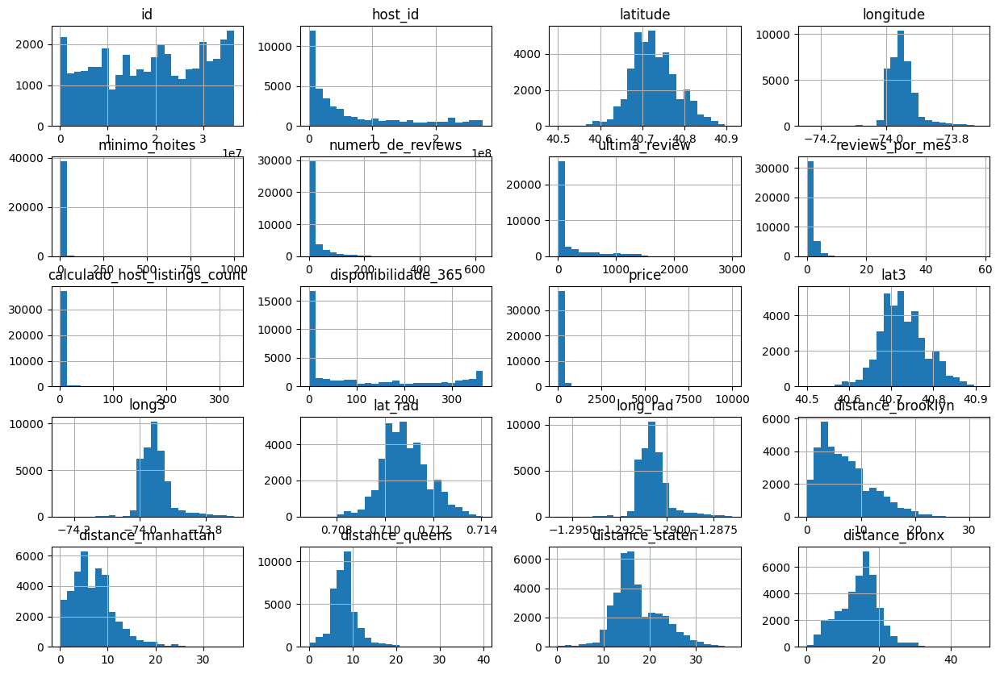

In [135]:
rcParams['figure.figsize'] = 15,10

num_attributes = df4.select_dtypes(include=['int64', 'float64'])
num_attributes.hist(bins=25);

### **4.1.3 Categorical variables**

In [136]:
fig = make_subplots(rows=1, cols=2,subplot_titles=('bairro_groups', 'room_types'))

fig.add_trace(go.Histogram(x=df4['bairro_group']),row=1, col=1)

fig.add_trace(go.Histogram(x=df4['room_type']),row=1, col=2)
fig.update_layout(showlegend=False)

fig.show()

In [137]:
df4['bairro'].value_counts().head(20)

bairro
Williamsburg          3118
Bedford-Stuyvesant    2974
Harlem                2144
Bushwick              1945
Upper West Side       1592
Hell's Kitchen        1577
East Village          1504
Upper East Side       1442
Midtown               1259
Crown Heights         1250
Greenpoint             906
East Harlem            899
Chelsea                897
Astoria                728
Lower East Side        719
Washington Heights     710
West Village           614
Financial District     595
Flatbush               495
Clinton Hill           443
Name: count, dtype: int64

## **4.2 Hypothesis**

### **4.2.1 Hypothesis mindmap**

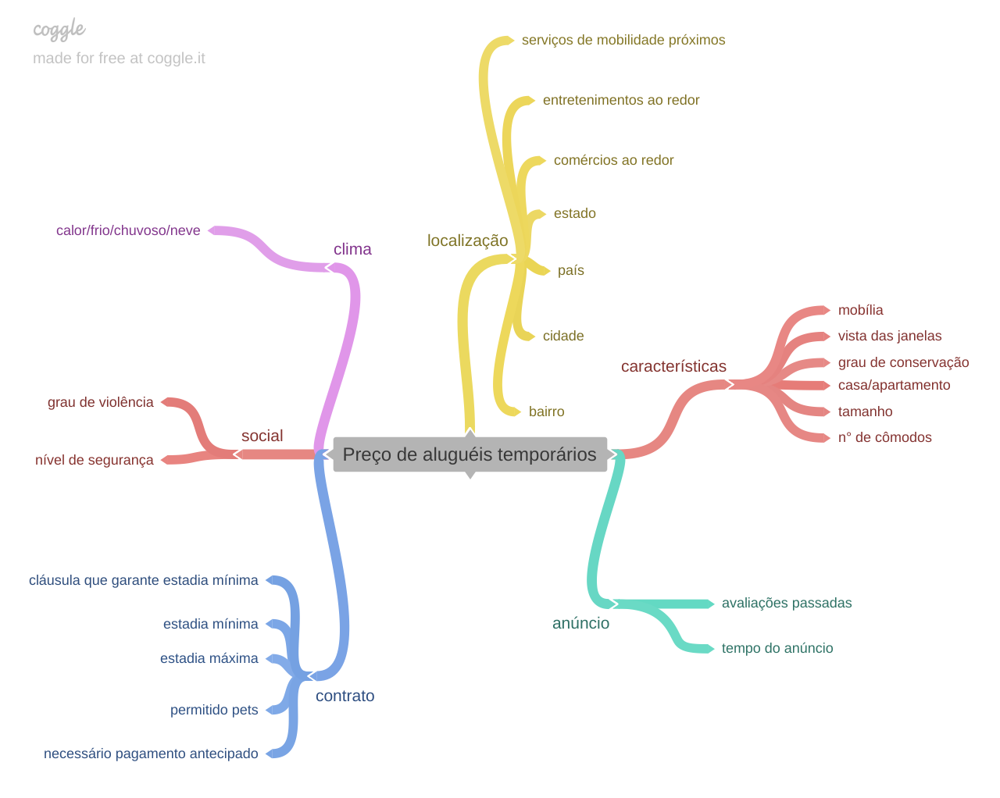

In [138]:
Image('../img/mindmap.png')

### **4.2.2 Hypothesis creation**

#### **H1 - Manhattan tem em média preços pelo menos 30% maiores**
**True**

In [139]:
aux1=df4[['bairro_group','price']].groupby('bairro_group').mean().sort_values('price',ascending=False).reset_index()
aux2=df4[['bairro_group','price']].groupby('bairro_group').median().sort_values('price',ascending=False).reset_index()
aux3=df4[['bairro_group','price']].groupby('bairro_group').std().sort_values('price',ascending=False).reset_index()

result1 = pd.merge(aux1, aux2, on='bairro_group', suffixes=('_mean', '_median'))
result2 = pd.merge(result1, aux3, on='bairro_group', suffixes=('', '_std'))
aux = result2.rename(columns={'price': 'price_std'})

viz = pd.melt(aux, id_vars=['bairro_group'], value_vars=['price_mean', 'price_median', 'price_std'],
                            var_name='Statistic', value_name='Value')

fig=px.bar(viz, x='bairro_group', y='Value', color='Statistic', barmode='group',
             labels={'Value': 'Price', 'Statistics': 'Statistic', 'bairro_group': 'Bairro Group'},
             title='Mean, Median, and Standard Deviation of Price by Bairro Group')

fig.update_layout(height=400)

fig.show()


city = 'Manhattan'

manhattan_mean = aux.loc[aux['bairro_group'] == city, 'price_mean'].values[0]
aux['diff_percent'] = ((aux['price_mean'] - manhattan_mean) / manhattan_mean) * 100

print('\n')
print(f"A diferença percentual da média de {city} em relação às outras cidades:\n")
print(aux[['bairro_group', 'diff_percent']])



A diferença percentual da média de Manhattan em relação às outras cidades:

    bairro_group  diff_percent
0      Manhattan      0.000000
1       Brooklyn    -36.960833
2  Staten Island    -41.154268
3         Queens    -49.246618
4          Bronx    -55.863517


#### **H2 - Room type do tipo 'Entire home/apt' são pelo menos 100% mais caros em média**
**False**

In [140]:
aux1=df4[['room_type','price']].groupby('room_type').mean().sort_values('price',ascending=False).reset_index()
aux2=df4[['room_type','price']].groupby('room_type').median().sort_values('price',ascending=False).reset_index()
aux3=df4[['room_type','price']].groupby('room_type').std().sort_values('price',ascending=False).reset_index()

result1 = pd.merge(aux1, aux2, on='room_type', suffixes=('_mean', '_median'))
result2 = pd.merge(result1, aux3, on='room_type', suffixes=('', '_std'))
aux = result2.rename(columns={'price': 'price_std'})

viz = pd.melt(aux, id_vars=['room_type'], value_vars=['price_mean', 'price_median', 'price_std'],
                            var_name='Statistic', value_name='Value')

fig=px.bar(viz, x='room_type', y='Value', color='Statistic', barmode='group',
             labels={'Value': 'Price', 'Statistics': 'Statistic', 'room_type': 'Room type'},
             title='Mean, Median, and Standard Deviation of Price by room type')

fig.update_layout(height=400)

fig.show()


room = 'Entire home/apt'

room_mean = aux.loc[aux['room_type'] == room, 'price_mean'].values[0]
aux['diff_percent'] = ((aux['price_mean'] - room_mean) / room_mean) * 100

print('\n')
print(f"A diferença percentual da média de {room} em relação aos outros room types:\n")
print(aux[['room_type', 'diff_percent']])



A diferença percentual da média de Entire home/apt em relação aos outros room types:

         room_type  diff_percent
0  Entire home/apt      0.000000
1     Private room    -57.721551
2      Shared room    -67.199822


#### **H3 Aluguéis disponíveis por no máximo uma semana são pelo menos 30% mais caros em média**

In [141]:
aux=df4[['minimo_noites','price']].groupby('minimo_noites').mean().sort_values('price',ascending=False).reset_index()

# check outliers
aux.sort_values('price',ascending=False).head(10)

,minimo_noites,price
0,114,4200.000000
1,100,1141.500000
2,40,464.833333
3,1000,400.000000
4,70,395.750000
5,365,388.434783
6,175,350.000000
7,198,346.000000
8,23,320.000000
9,80,269.285714


In [142]:
aux=aux[aux['price']<1000]

fig=px.bar(aux,x='minimo_noites',y='price',title='Mean of Price by minimo_noites')

fig.show()

condicao = aux['minimo_noites'] <= 7

media_menor_7 = aux.loc[condicao, 'price'].mean()
media_maior_7 = aux.loc[~condicao, 'price'].mean()

diff_percent = ((media_maior_7 - media_menor_7) / media_maior_7) * 100

print('\n')
print(f"A média do preço para minimo_noites até 7 é: {media_menor_7:.2f}")
print(f"A média do preço para minimo_noites maior que 7 é: {media_maior_7:.2f}")
print(f"A diferença percentual é: {diff_percent:.2f}%")



A média do preço para minimo_noites até 7 é: 154.76
A média do preço para minimo_noites maior que 7 é: 147.16
A diferença percentual é: -5.17%


#### **H4 ?**

## **4.3 Bivariate analysis**

### **id**

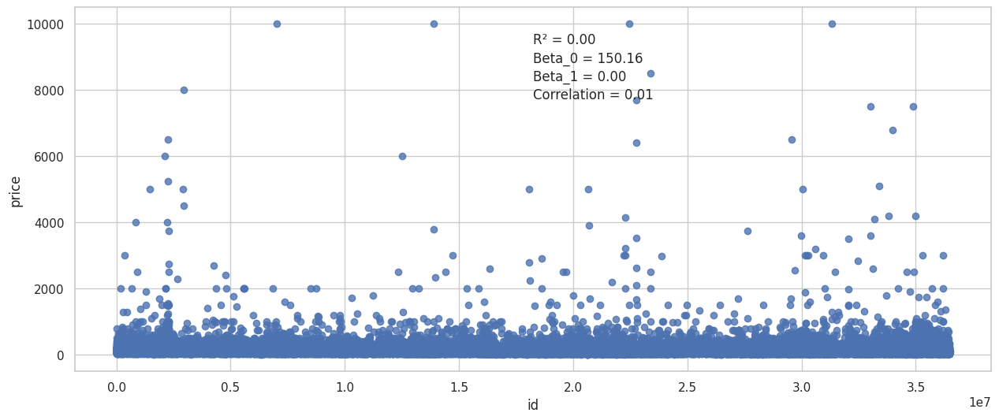

In [143]:
X = sm.add_constant(df4['id'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['id'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='id', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='id', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **nome**

In [144]:
print(len(df4))
print(len(df4['nome'].unique()))

39115
38444


In [145]:
# aux=df4[['nome','price']].groupby('nome').mean().sort_values('price',ascending=False).reset_index().head(50)
# aux

In [146]:
# aux=df4[['nome','price']].groupby('nome').mean().sort_values('price',ascending=True).reset_index().head(100)
# aux

### **host_name**

In [147]:
print(len(df4))
print(len(df4['host_name'].unique()))

39115
10029


In [148]:
# aux=df4[['host_name','price']].groupby('host_name').mean().sort_values('price',ascending=False).reset_index().head(20)
aux = (df4[['host_name', 'price']].groupby('host_name')
                                  .agg({'price': ['mean', 'count']})
                                  .sort_values(('price', 'mean'), ascending=False)
                                  .reset_index().head(20))
aux

host_name   price      
                       mean count
0               Rum  8500.0     1
1       Jay And Liz  6000.0     1
2          Kathrine  5158.0     2
3           Sarah-2  5000.0     1
4              Nony  4200.0     1
5            Jelena  3400.0     3
6   Luxury Property  3000.0     1
7           Rogelio  2999.0     1
8          Viberlyn  2995.0     1
9   Ilo And Richard  2990.0     1
10            Lanie  2900.0     1
11             Shah  2600.0     1
12             Indi  2400.0     1
13            Iveta  2350.0     1
14              Ege  2000.0     1
15      Mary Rotsen  1999.0     1
16     Ben And Jess  1899.0     1
17            Romeo  1799.0     1
18            NuAve  1750.0     1
19             Ilsa  1750.0     1

In [149]:
aux = (df4[['host_name', 'price']].groupby('host_name')
                                  .agg({'price': ['mean', 'count']})
                                  .sort_values(('price', 'mean'), ascending=True)
                                  .reset_index().head(20))
aux

host_name price      
                          mean count
0                Aymeric   0.0     1
1                 Qiuchi   0.0     1
2      Vishanti & Jeremy  10.0     1
3                  Salim  10.0     1
4               Carolann  12.0     1
5                 Kevin4  18.0     2
6                   Imoy  19.5     2
7            Rimma & Jim  20.0     1
8               Elisheva  20.0     1
9           Ben And Jane  20.0     1
10             Kartikeya  20.0     1
11                Satish  22.0     1
12               Jesus A  22.0     1
13  Christine & Einstein  22.0     1
14                 Zafir  23.0     1
15                   Ysa  24.0     1
16            LKL Rental  24.0     3
17                Kelcie  24.0     1
18                Kadeen  25.0     1
19                Obinna  25.0     1

### **bairro_group**

In [150]:
aux1=df4[['bairro_group','price']].groupby('bairro_group').mean().sort_values('price',ascending=False).reset_index()
aux2=df4[['bairro_group','price']].groupby('bairro_group').median().sort_values('price',ascending=False).reset_index()
aux3=df4[['bairro_group','price']].groupby('bairro_group').std().sort_values('price',ascending=False).reset_index()

result1 = pd.merge(aux1, aux2, on='bairro_group', suffixes=('_mean', '_median'))
result2 = pd.merge(result1, aux3, on='bairro_group', suffixes=('', '_std'))
aux = result2.rename(columns={'price': 'price_std'})

viz = pd.melt(aux, id_vars=['bairro_group'], value_vars=['price_mean', 'price_median', 'price_std'],
                            var_name='Statistic', value_name='Value')

fig=px.bar(viz, x='bairro_group', y='Value', color='Statistic', barmode='group',
             labels={'Value': 'Price', 'Statistics': 'Statistic', 'bairro_group': 'Bairro Group'},
             title='Mean, Median, and Standard Deviation of Price by Bairro Group')

fig.update_layout(height=400)

fig.show() 

### **bairro**

In [151]:
print(len(df4))
print(len(df4['bairro'].unique()))

39115
218


In [152]:
aux1=df4[['bairro','price']].groupby('bairro').mean().sort_values('price',ascending=False).rename(columns={'price':'mean_price'}).reset_index().head(10)
px.bar(aux1,x='bairro',y='mean_price')

In [153]:
aux1=df4[['bairro','price']].groupby('bairro').mean().sort_values('price',ascending=True).rename(columns={'price':'mean_price'}).reset_index().head(10)
px.bar(aux1,x='bairro',y='mean_price')

### **latitude/longitude**

In [154]:
# criação de mapa mundi para verificar se existe algum lat/long errado

# lats=df4['latitude']
# lons=df4['longitude']
# locations = list(zip(lats, lons))

# m = folium.Map(location=[np.mean(lats), np.mean(lons)], tiles="Cartodb Positron", zoom_start=1)
# marker_cluster = MarkerCluster(
#     locations=locations,
#     name="1000 clustered icons",
#     overlay=True,
#     control=True)

# marker_cluster.add_to(m)

# folium.LayerControl().add_to(m)

# m

## m.save('../img/map.html')

### **room_type**

In [155]:
aux1=df4[['room_type','price']].groupby('room_type').mean().sort_values('price',ascending=False).reset_index()
aux2=df4[['room_type','price']].groupby('room_type').median().sort_values('price',ascending=False).reset_index()
aux3=df4[['room_type','price']].groupby('room_type').std().sort_values('price',ascending=False).reset_index()

result1 = pd.merge(aux1, aux2, on='room_type', suffixes=('_mean', '_median'))
result2 = pd.merge(result1, aux3, on='room_type', suffixes=('', '_std'))
aux = result2.rename(columns={'price': 'price_std'})

viz = pd.melt(aux, id_vars=['room_type'], value_vars=['price_mean', 'price_median', 'price_std'],
                            var_name='Statistic', value_name='Value')

fig=px.bar(viz, x='room_type', y='Value', color='Statistic', barmode='group',
             labels={'Value': 'Price', 'Statistics': 'Statistic', 'room_type': 'Room type'},
             title='Mean, Median, and Standard Deviation of Price by room type')

fig.update_layout(height=400)

fig.show()

### **minimo_noites**

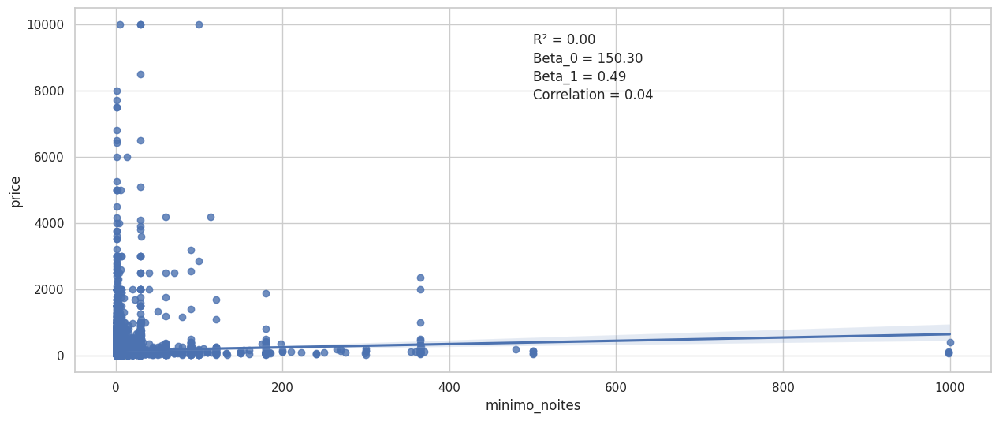

In [156]:
X = sm.add_constant(df4['minimo_noites'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['minimo_noites'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='minimo_noites', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='minimo_noites', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **numero_de_reviews**

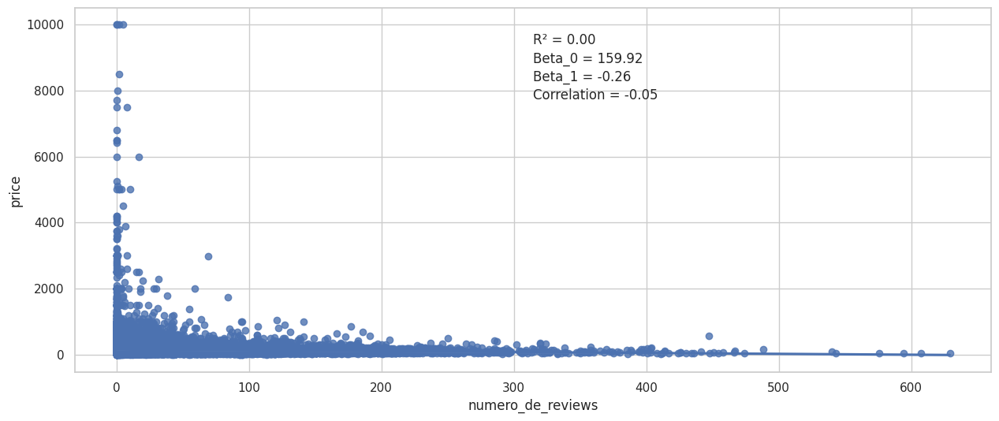

In [157]:
X = sm.add_constant(df4['numero_de_reviews'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['numero_de_reviews'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='numero_de_reviews', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='numero_de_reviews', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **ultima_review**

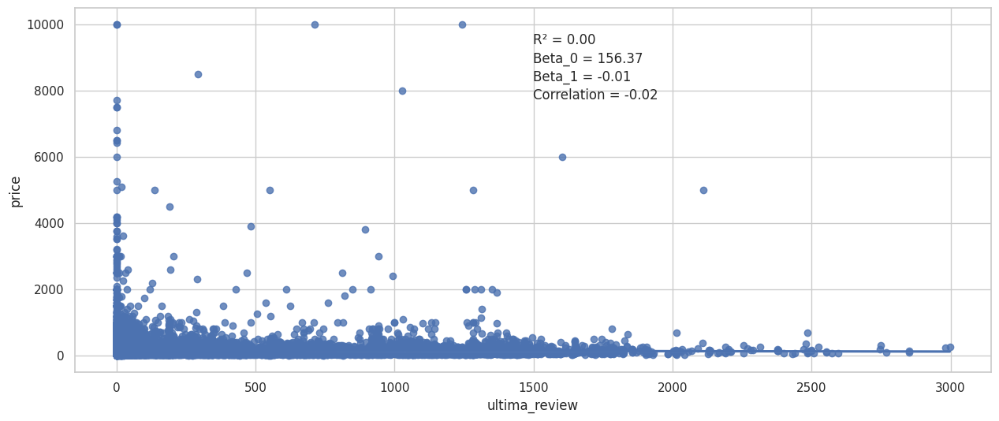

In [158]:
X = sm.add_constant(df4['ultima_review'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['ultima_review'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='ultima_review', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='ultima_review', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **reviews_por_mes**

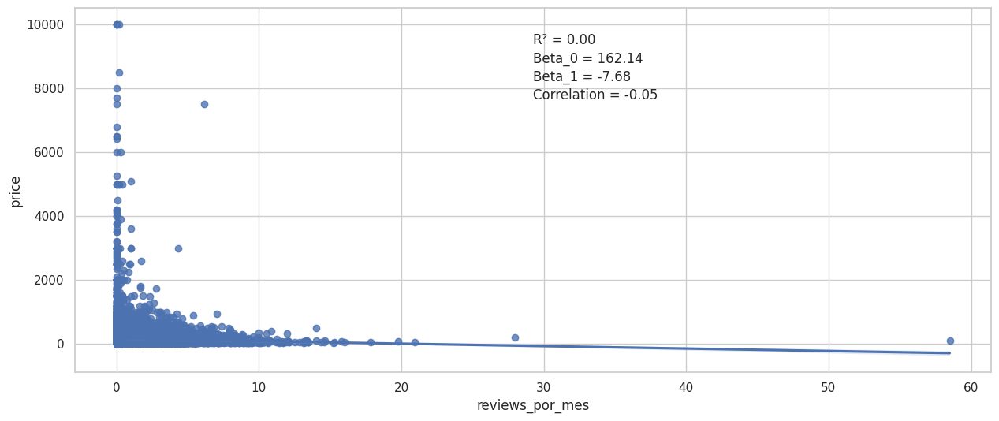

In [159]:
X = sm.add_constant(df4['reviews_por_mes'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['reviews_por_mes'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='reviews_por_mes', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='reviews_por_mes', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **calculado_host_listings_count**

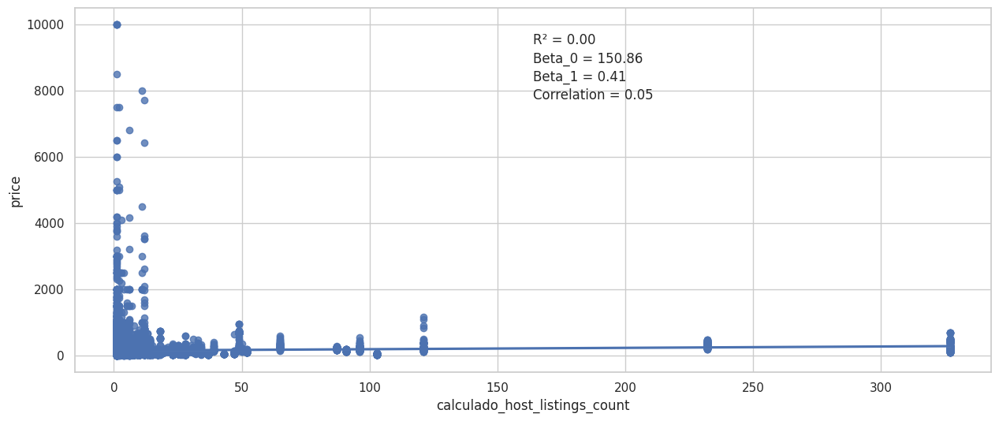

In [160]:
X = sm.add_constant(df4['calculado_host_listings_count'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['calculado_host_listings_count'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='calculado_host_listings_count', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='calculado_host_listings_count', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **disponibilidade_365**

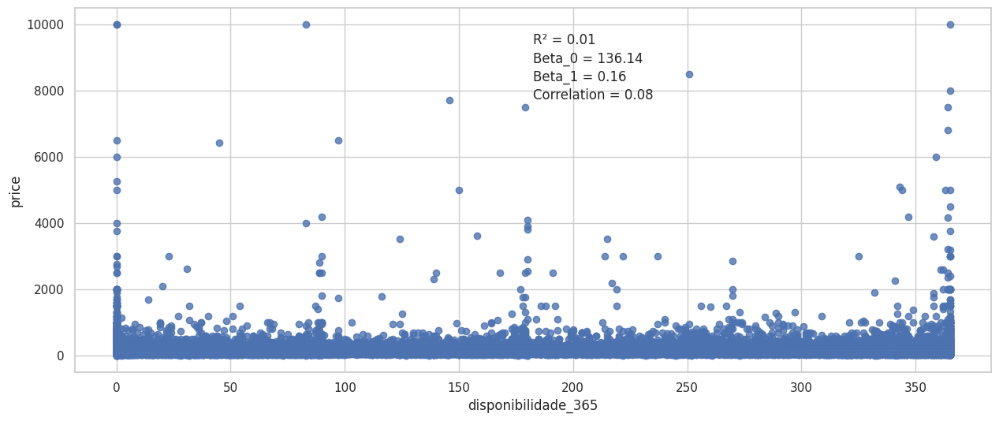

In [161]:
X = sm.add_constant(df4['disponibilidade_365'])
y = df4['price']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = df4['disponibilidade_365'].corr(df4['price'])

sns.set(style="whitegrid")
ax = sns.regplot(x='disponibilidade_365', y='price', data=df4)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='disponibilidade_365', ylabel='price')
plt.gcf().set_size_inches(15, 6)
plt.show()

## **4.4 Multivariate analysis**


### **4.4.1 Numerical attributes**

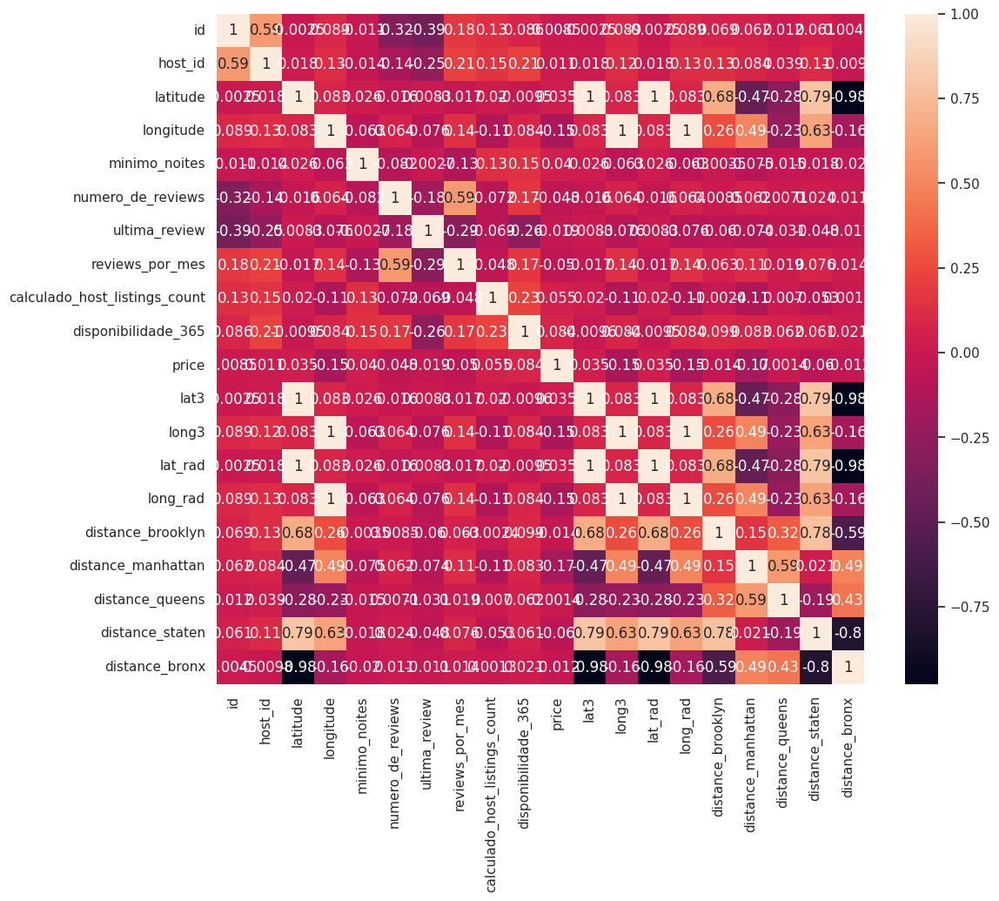

In [162]:
num_attributes = df4.select_dtypes(include=['int64', 'float64'])

aux=df4[['host_id','id','price','minimo_noites','numero_de_reviews','ultima_review','reviews_por_mes','calculado_host_listings_count','disponibilidade_365']]
correlation=num_attributes.corr(method='pearson')

plt.figure(figsize=(12, 10))
sns.heatmap(correlation,annot=True);
plt.show()

#### numero_de_reviews e id

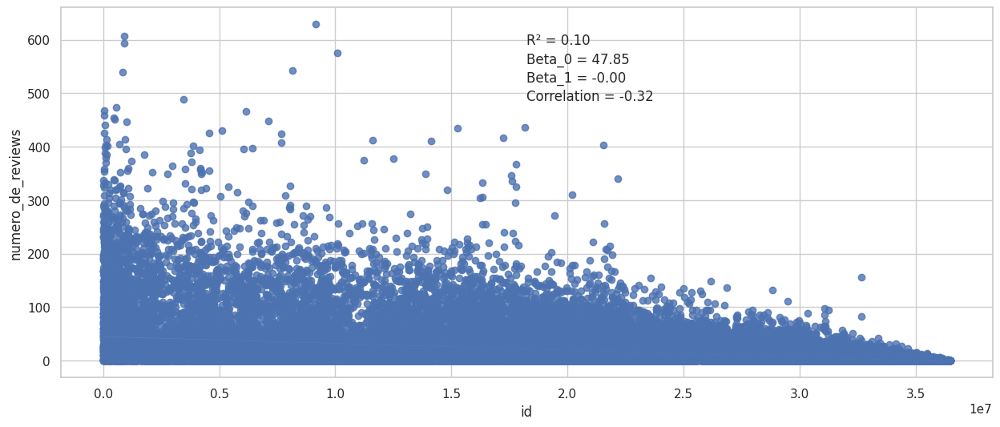

In [163]:
X = sm.add_constant(aux['id'])
y = aux['numero_de_reviews']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = aux['id'].corr(aux['numero_de_reviews'])

sns.set(style="whitegrid")
ax = sns.regplot(x='id', y='numero_de_reviews', data=aux)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='id', ylabel='numero_de_reviews')
plt.gcf().set_size_inches(15, 6)
plt.show()

#### minimo_noites e numero_de_reviews

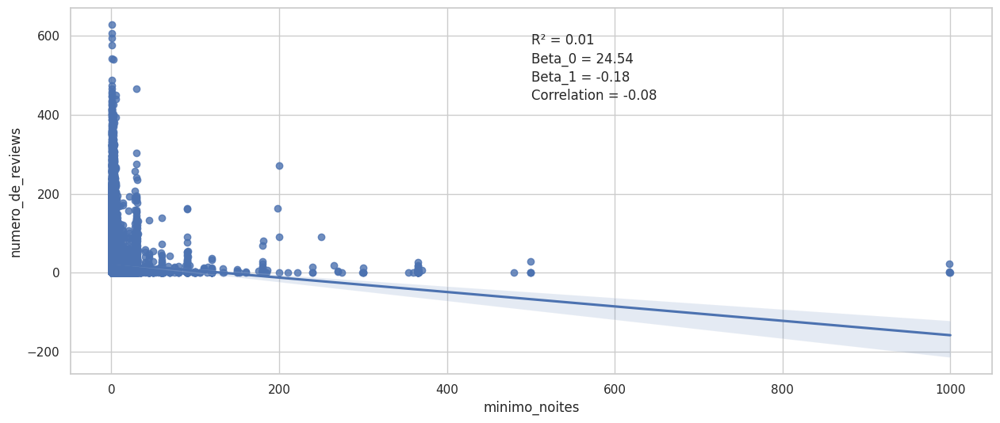

In [164]:
X = sm.add_constant(aux['minimo_noites'])
y = aux['numero_de_reviews']
model = sm.OLS(y, X).fit()

beta_0 = model.params[0]
beta_1 = model.params[1]

r_squared = model.rsquared

correlation = aux['minimo_noites'].corr(aux['numero_de_reviews'])

sns.set(style="whitegrid")
ax = sns.regplot(x='minimo_noites', y='numero_de_reviews', data=aux)

ax.annotate(f'R² = {r_squared:.2f}', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_0 = {beta_0:.2f}', xy=(0.5, 0.85), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Beta_1 = {beta_1:.2f}', xy=(0.5, 0.80), xycoords='axes fraction', fontsize=12)
ax.annotate(f'Correlation = {correlation:.2f}', xy=(0.5, 0.75), xycoords='axes fraction', fontsize=12)

ax.set(xlabel='minimo_noites', ylabel='numero_de_reviews')
plt.gcf().set_size_inches(15, 6)
plt.show()

### **4.4.2 Categorical attributes**

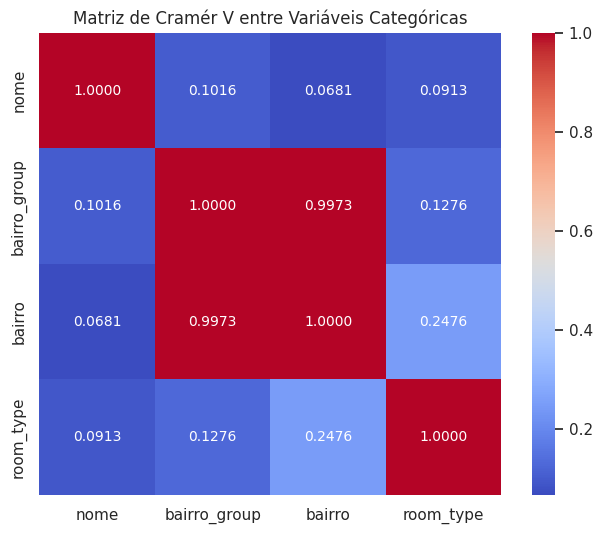

In [165]:
nome = df4['nome']
bairro_group = df4['bairro_group']
bairro = df4['bairro']
room_type = df4['room_type']

# Criar DataFrame para visualização
dataframe_for_heatmap = pd.DataFrame({
    'nome': nome,
    'bairro_group': bairro_group,
    'bairro': bairro,
    'room_type': room_type
})

# Calcular matriz de Cramér V
cramers_v_matrix = calculate_cramers_v_matrix(dataframe_for_heatmap)

# Criar heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cramers_v_matrix, annot=True, cmap='coolwarm', cbar=True, square=True, fmt='.4f', annot_kws={'size': 10})
plt.title('Matriz de Cramér V entre Variáveis Categóricas')
plt.show()

## **4.5 Main insights**

- A variável resposta possui muitos outliers mas tem uma concentração muito alta em valores mais baixos, também possui 9 linhas com valor igual a zero.

- A chave única para cada anúncio e id do usuário provavelmente são geradas aleatoriamente.

- Alguns host names são repetidos trazendo uma média de preço para um nome específico; isso talvez até possibilitasse o uso de um target encoder, porém atrelar nomes de pessoas a valores de aluguel não faz muito sentido.

- Existe uma relação muito clara entre bairro_group e o preço (todos os imóveis estão em Nova York).

- O bairro está atrelado ao bairro_group, portanto é uma variável importante, porém devido a essa forte correlação talvez uma delas será excluída.

- Latitude e longitude podem se tornar importantes com algum tratamento, depois será necessário estudar se será inviabilizada devido a uma possível correlação com bairro_group/bairro.

- Existe uma relação muito clara entre room_type e o preço.

- Minimo_noites, numero_de_reviews, ultima_review, reviews_por_mes, calculado_host_listings_count e disponibilidade_365 não possuem uma correlação importante com o preço.

- Fora as correlações já citadas, não há outras importantes. 

# **5 Data preparation**

In [220]:
df5=df4.copy()
X_train=df5.drop(['price'],axis=1)
y_train=df5['price']
X_val=x_val.copy()
X_test=x_test.copy()

## **5.2 Histograms**

In [ ]:
px.histogram(df5,x='minimo_noites')

In [ ]:
px.histogram(df5,x='numero_de_reviews')

In [ ]:
px.histogram(df5,x='ultima_review')

In [ ]:
px.histogram(df5,x='reviews_por_mes')

In [ ]:
px.histogram(df5,x='calculado_host_listings_count')

In [ ]:
px.histogram(df5,x='disponibilidade_365')

In [ ]:
px.histogram(df5,x='price')

In [ ]:
px.histogram(df5,x='distance')

## **<s>5.3 Standardization<s/>**

## **5.4 Rescaling**

In [221]:
y_train=np.log1p(y_train) 
y_val=np.log1p(y_val)
y_test=np.log1p(y_test) 

## **5.5 Encoding**

In [222]:
# # nome
# te1 = TargetEncoder(cols=['nome'])
# X_train=te1.fit_transform(X_train, y_train)
# X_val=te1.transform(X_val, y_val)
# X_test=te1.transform(X_test, y_test)

# # host_name
# te2 = TargetEncoder(cols=['host_name'])
# X_train=te2.fit_transform(X_train, y_train)
# X_val=te2.transform(X_val, y_val)
# X_test=te2.transform(X_test, y_test)

# bairro_groups
X_train=pd.get_dummies(X_train,prefix=['bairro_group'],columns=['bairro_group'])
X_val=pd.get_dummies(X_val,prefix=['bairro_group'],columns=['bairro_group'])
X_test=pd.get_dummies(X_test,prefix=['bairro_group'],columns=['bairro_group'])

# bairro
te3 = TargetEncoder(cols=['bairro'])
X_train = te3.fit_transform(X_train, y_train)
X_val = te3.transform(X_val)
X_test = te3.transform(X_test)

# room_type
X_train=pd.get_dummies(X_train,prefix=['room_type'],columns=['room_type'])
X_val=pd.get_dummies(X_val,prefix=['room_type'],columns=['room_type'])
X_test=pd.get_dummies(X_test,prefix=['room_type'],columns=['room_type'])

# category
X_train=pd.get_dummies(X_train,prefix=['category'],columns=['category'])
X_val=pd.get_dummies(X_val,prefix=['category'],columns=['category'])
X_test=pd.get_dummies(X_test,prefix=['category'],columns=['category'])

In [ ]:
# print(X_train.isna().sum())
# print(X_val.isna().sum())
# print(X_test.isna().sum())

# **6 Feature selection**

In [223]:
df6=df5.copy()

In [ ]:
# # model definition
# forest=en.Extra(random_state=42) 

# # data preparation
# X_train_n=X_train.drop(['id','host_id','price'],axis=1)
# y_train_n=y_train.values
# forest.fit(X_train_n,y_train_n)

In [224]:
X_train=X_train[['bairro', 
       'minimo_noites', 'numero_de_reviews', 'calculado_host_listings_count',
       'disponibilidade_365', 'latitude', 'longitude',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room']]

X_val=X_val[['bairro', 
       'minimo_noites', 'numero_de_reviews', 'calculado_host_listings_count',
       'disponibilidade_365', 'latitude', 'longitude',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room']]

X_test=X_test[['bairro', 
       'minimo_noites', 'numero_de_reviews', 'calculado_host_listings_count',
       'disponibilidade_365', 'latitude', 'longitude',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room']]

# **7 Machine Learning**

In [225]:
df7=df6.copy()

## **7.1 Average model**

In [992]:
y_train = df7['price']

y_mean = y_train.mean()

baseline_predictions = pd.Series([y_mean] * len(y_train))

mae_baseline = mean_absolute_error(y_train, baseline_predictions)
mape_baseline = mean_absolute_percentage_error(y_train, baseline_predictions)
mse_baseline = mean_squared_error(y_train, baseline_predictions)
rmse_baseline = np.sqrt(mse_baseline)

result_baseline = pd.DataFrame({'Model Name': 'Baseline model',
                       'MAE': mae_baseline,
                       'MAPE': mape_baseline,
                       'RMSE': rmse_baseline}, index=[0])
result_baseline

,Model Name,MAE,MAPE,RMSE
0,Baseline model,93.87391,1.593374e+14,244.152833


## **7.2 Linear regression**

In [1176]:
# model
lr=LinearRegression().fit(X_train,y_train)

# prediction
lr_yhat=lr.predict(X_val)

mae_lr = mean_absolute_error(np.expm1(y_val), np.expm1(lr_yhat))
mape_lr = mean_absolute_percentage_error_func(np.expm1(y_val), np.expm1(lr_yhat))
mse_lr = mean_squared_error(np.expm1(y_val), np.expm1(lr_yhat))
rmse_lr = np.sqrt((mse_lr))

result_lr = pd.DataFrame({'Model Name': 'Linear Regression',
                       'MAE': mae_lr,
                       'MAPE': mape_lr,
                       'RMSE': rmse_lr}, index=[0])
result_lr

,Model Name,MAE,MAPE,RMSE
0,Linear Regression,57.056099,0.338732,248.07209


### **7.2.1 Linear regression model - Cross validation** 

In [1177]:
lr_cv = LinearRegression()

kf = KFold(n_splits=5, shuffle=True, random_state=42)

y_pred_log = cross_val_predict(lr_cv, X_train, y_train, cv=kf)

y_train_original = np.expm1(y_train)
y_pred_original = np.expm1(y_pred_log)

mae_lr_cv = mean_absolute_error(y_train_original, y_pred_original)
mape_lr_cv = mean_absolute_percentage_error_func(y_train_original, y_pred_original)
rmse_lr_cv = np.sqrt(mean_squared_error(y_train_original, y_pred_original))

std_mae = np.std(-mae_lr_cv)
std_mape = np.std(-mape_lr_cv)
std_rmse = np.std(-rmse_lr_cv)

result_lr_cv = pd.DataFrame({'Model Name': 'Linear Regression CV',
                              'MAE': mae_lr_cv,
                              'MAPE': mape_lr_cv,
                              'RMSE': rmse_lr_cv}, index=[0])

result_lr_cv

,Model Name,MAE,MAPE,RMSE
0,Linear Regression CV,62.181488,0.350702,231.802795


## **7.3 Linear regression regularized**

In [1178]:
# model
lrr=Lasso().fit(X_train,y_train)
 
# prediction
lrr_yhat=lrr.predict(X_val)

mae_lrr = mean_absolute_error(np.expm1(y_val), np.expm1(lrr_yhat))
mape_lrr = mean_absolute_percentage_error_func(np.expm1(y_val), np.expm1(lrr_yhat))
mse_lrr = mean_squared_error(np.expm1(y_val), np.expm1(lrr_yhat))
rmse_lrr = np.sqrt(mse_lrr)

result_lrr = pd.DataFrame({'Model Name': 'Lasso',
                       'MAE': mae_lrr,
                       'MAPE': mape_lrr,
                       'RMSE': rmse_lrr}, index=[0])
result_lrr

,Model Name,MAE,MAPE,RMSE
0,Lasso,78.605243,0.587548,259.555323


### **7.3.1 Linear regression regularized - Cross validation**

In [1179]:
lrr_cv = Lasso()

kf = KFold(n_splits=5, shuffle=True, random_state=42)

y_pred_log = cross_val_predict(lrr_cv, X_train, y_train, cv=kf)

y_train_original = np.expm1(y_train)
y_pred_original = np.expm1(y_pred_log)

mae_lrr_cv = mean_absolute_error(y_train_original, y_pred_original)
mape_lrr_cv = mean_absolute_percentage_error_func(y_train_original, y_pred_original)
rmse_lrr_cv = np.sqrt(mean_squared_error(y_train_original, y_pred_original))

std_mae = np.std(-mae_lrr_cv)
std_mape = np.std(-mape_lrr_cv)
std_rmse = np.std(-rmse_lrr_cv)

result_lrr_cv = pd.DataFrame({'Model Name': 'Linear Regression CV',
                              'MAE': mae_lrr_cv,
                              'MAPE': mape_lrr_cv,
                              'RMSE': rmse_lrr_cv}, index=[0])

result_lrr_cv

,Model Name,MAE,MAPE,RMSE
0,Linear Regression CV,84.22884,0.607882,246.68684


## **7.4 Random Forest Regressor**

In [1411]:
# model
rf=RandomForestRegressor(n_jobs=-1,random_state=95).fit(X_train,y_train)

# prediction
rf_yhat=rf.predict(X_val)

mae_rf = mean_absolute_error(np.expm1(y_val), np.expm1(rf_yhat))
mape_rf = mean_absolute_percentage_error_func(np.expm1(y_val), np.expm1(rf_yhat))
mse_rf = mean_squared_error(np.expm1(y_val), np.expm1(rf_yhat))
rmse_rf = np.sqrt(mse_rf)

result_rf = pd.DataFrame({'Model Name': 'Random Forest',
                       'MAE': mae_rf,
                       'MAPE': mape_rf,
                       'RMSE': rmse_rf}, index=[0])
result_rf

,Model Name,MAE,MAPE,RMSE
0,Random Forest,54.090428,0.325645,243.675125


### **7.4.1 Random forest regressor - Cross validation** 

In [ ]:
rf_cv=RandomForestRegressor(n_jobs=-1,random_state=95)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

y_pred_log = cross_val_predict(rf_cv, X_train, y_train, cv=kf)

y_train_original = np.expm1(y_train)
y_pred_original = np.expm1(y_pred_log)

mae_rf_cv = mean_absolute_error(y_train_original, y_pred_original)
mape_rf_cv = mean_absolute_percentage_error_func(y_train_original, y_pred_original)
rmse_rf_cv = np.sqrt(mean_squared_error(y_train_original, y_pred_original))

std_mae = np.std(-mae_rf_cv)
std_mape = np.std(-mape_rf_cv)
std_rmse = np.std(-rmse_rf_cv)

result_rf_cv = pd.DataFrame({'Model Name': 'Random Forest CV',
                              'MAE': mae_rf_cv,
                              'MAPE': mape_rf_cv,
                              'RMSE': rmse_rf_cv}, index=[0])

result_rf_cv

## **7.5 XGBoost regressor**

In [1191]:
xgb_model=XGBRegressor(n_jobs=-1,random_state=95).fit(X_train,y_train)

# prediction
xgb_yhat=xgb_model.predict(X_val)

mae_xgb = mean_absolute_error(np.expm1(y_val), np.expm1(xgb_yhat))
mape_xgb = mean_absolute_percentage_error_func(np.expm1(y_val), np.expm1(xgb_yhat))
mse_xgb = mean_squared_error(np.expm1(y_val), np.expm1(xgb_yhat))
rmse_xgb = np.sqrt(mse_xgb)

result_xgb = pd.DataFrame({'Model Name': 'XGBoost',
                       'MAE': mae_xgb,
                       'MAPE': mape_xgb,
                       'RMSE': rmse_xgb}, index=[0])
result_xgb

,Model Name,MAE,MAPE,RMSE
0,XGBoost,53.338486,0.315978,243.841427


### **7.6 XGBoost regressor - Cross validation**

In [1412]:
xgb_model_cv=XGBRegressor(n_jobs=-1,random_state=95)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

y_pred_log = cross_val_predict(xgb_model_cv, X_train, y_train, cv=kf)

y_train_original = np.expm1(y_train)
y_pred_original = np.expm1(y_pred_log)

mae_xgb_cv = mean_absolute_error(y_train_original, y_pred_original)
mape_xgb_cv = mean_absolute_percentage_error_func(y_train_original, y_pred_original)
rmse_xgb_cv = np.sqrt(mean_squared_error(y_train_original, y_pred_original))

std_mae = np.std(-mae_xgb_cv)
std_mape = np.std(-mape_xgb_cv)
std_rmse = np.std(-rmse_xgb_cv)

result_xgb_cv = pd.DataFrame({'Model Name': 'XGBoost CV',
                              'MAE': mae_xgb_cv,
                              'MAPE': mape_xgb_cv,
                              'RMSE': rmse_xgb_cv}, index=[0])

result_xgb_cv

,Model Name,MAE,MAPE,RMSE
0,XGBoost CV,57.813798,0.330866,220.26706


## **7.6 CatBoost regressor**

In [226]:
cat=CatBoostRegressor(logging_level='Silent').fit(X_train,y_train)

# prediction
cat_yhat=cat.predict(X_val)

mae_cat = mean_absolute_error(np.expm1(y_val), np.expm1(cat_yhat))
mape_cat = mean_absolute_percentage_error_func(np.expm1(y_val), np.expm1(cat_yhat))
mse_cat = mean_squared_error(np.expm1(y_val), np.expm1(cat_yhat))
rmse_cat = np.sqrt(mse_cat)

result_cat = pd.DataFrame({'Model Name': 'CatBoost',
                       'MAE': mae_cat,
                       'MAPE': mape_cat,
                       'RMSE': rmse_cat}, index=[0])
result_cat

,Model Name,MAE,MAPE,RMSE
0,CatBoost,52.492125,0.306377,244.196079


### **7.6.1 CatBoost regressor - Cross validation**

In [227]:
cat_cv=CatBoostRegressor(logging_level='Silent')

kf = KFold(n_splits=5, shuffle=True, random_state=42)

y_pred_log = cross_val_predict(cat_cv, X_train, y_train, cv=kf)

y_train_original = np.expm1(y_train)
y_pred_original = np.expm1(y_pred_log)

mae_cat_cv = mean_absolute_error(y_train_original, y_pred_original)
mape_cat_cv = mean_absolute_percentage_error_func(y_train_original, y_pred_original)
rmse_cat_cv = np.sqrt(mean_squared_error(y_train_original, y_pred_original))

std_mae = np.std(-mae_cat_cv)
std_mape = np.std(-mape_cat_cv)
std_rmse = np.std(-rmse_cat_cv)

result_cat_cv = pd.DataFrame({'Model Name': 'CatBoost CV',
                              'MAE': mae_cat_cv,
                              'MAPE': mape_cat_cv,
                              'RMSE': rmse_cat_cv}, index=[0])

result_cat_cv

,Model Name,MAE,MAPE,RMSE
0,CatBoost CV,56.905147,0.319151,220.170782


## **7.7 Compare performances**

In [ ]:
modelling_result=pd.concat([result_baseline,result_lr,result_lrr,result_rf,result_xgb,result_cat])
modelling_result_cv=pd.concat([result_baseline,result_lr_cv,result_lrr_cv,result_rf_cv,result_xgb_cv,result_cat_cv])

modelling_result.sort_values('MAE',ascending=True)

## **7.8 Compare cross-validated performances**

In [ ]:
modelling_result_cv.sort_values('MAE',ascending=True)

## **7.9 - Final model**

In [228]:
full_x = pd.concat ([X_train, X_val], axis=0,ignore_index=True) 
full_y = pd.concat ([y_train, y_val], axis=0,ignore_index=True) 

cat=CatBoostRegressor(logging_level='Silent').fit(full_x,full_y)

# prediction
cat_yhat=cat.predict(X_test)

mae_cat = mean_absolute_error(np.expm1(y_test), np.expm1(cat_yhat))
mape_cat = mean_absolute_percentage_error_func(np.expm1(y_test), np.expm1(cat_yhat))
mse_cat = mean_squared_error(np.expm1(y_test), np.expm1(cat_yhat))
rmse_cat = np.sqrt(mse_cat)

final_result_cat = pd.DataFrame({'Model Name': 'CatBoost',
                       'MAE': mae_cat,
                       'MAPE': mape_cat,
                       'RMSE': rmse_cat}, index=[0])
final_result_cat

,Model Name,MAE,MAPE,RMSE
0,CatBoost,52.044718,0.309061,159.455723


# <s>**8 Hyperparameter fine-tuning**<s/>

# **9 Error translation and interpretation**

In [234]:
df9=x_test.copy()
df9['price']=np.expm1(y_test)
df9['predictions']=np.expm1(cat_yhat)

## **9.1 Business performance**

In [235]:
# sum of predictions
df91=df9[['id','predictions','price']].groupby('id').sum().reset_index()             

# MAE and MAPE
df9_aux1=(df9[['id','price','predictions']].groupby('id')
          .apply(lambda x: mean_absolute_error (x['price'],x['predictions']))
          .reset_index().rename(columns={0:'MAE'}))

df9_aux2=(df9[['id','price','predictions']].groupby('id')
          .apply(lambda x: mean_absolute_percentage_error (x['price'],x['predictions']))
          .reset_index().rename(columns={0:'MAPE'}))

# merge
df9_aux3=pd.merge(df9_aux1,df9_aux2,how='inner',on='id')
df92=pd.merge(df91,df9_aux3,how='inner',on='id')

# scenarios
df92['worst_scenario']=df92['predictions'] - df92['MAE']
df92['best_scenario']=df92['predictions'] + df92['MAE']

# order columns
df92=df92[['id','price','predictions','worst_scenario','best_scenario','MAE','MAPE']]

df92['price']=df92['price'].map('${:,.2f}'.format)
df92['predictions']=df92['predictions'].map('${:,.2f}'.format)
df92['worst_scenario']=df92['worst_scenario'].map('${:,.2f}'.format)
df92['best_scenario']=df92['best_scenario'].map('${:,.2f}'.format)

In [236]:
# top 10 predictions
df92.sort_values('MAPE',ascending=True).head(10).reset_index(drop=True)

,id,price,predictions,worst_scenario,best_scenario,MAE,MAPE
0,16814205,$53.00,$52.99,$52.99,$53.00,0.006005,0.000113
1,13502841,$230.00,$229.96,$229.92,$230.00,0.041686,0.000181
2,5916713,$69.00,$68.98,$68.97,$69.00,0.016917,0.000245
3,9616453,$75.00,$75.03,$75.00,$75.05,0.027157,0.000362
4,35268488,$41.00,$40.98,$40.96,$41.00,0.017786,0.000434
5,22135247,$55.00,$55.02,$55.00,$55.05,0.023868,0.000434
6,20235984,$55.00,$54.97,$54.94,$55.00,0.027835,0.000506
7,1586454,$48.00,$48.03,$48.00,$48.05,0.026742,0.000557
8,12001854,$239.00,$238.86,$238.73,$239.00,0.135300,0.000566
9,32661869,$60.00,$60.03,$60.00,$60.07,0.034375,0.000573


In [237]:
# top 10 worse predictions
df92.sort_values('MAPE',ascending=False).head(10).reset_index(drop=True)

,id,price,predictions,worst_scenario,best_scenario,MAE,MAPE
0,21304320,$0.00,$24.66,$0.00,$49.33,24.663221,1.110733e+17
1,25839759,$10.00,$118.44,$10.00,$226.89,108.444969,1.084450e+01
2,21981703,$12.00,$125.38,$12.00,$238.76,113.378856,9.448238e+00
3,36280646,$16.00,$110.88,$16.00,$205.76,94.881997,5.930125e+00
4,35612982,$12.00,$73.69,$12.00,$135.39,61.693761,5.141147e+00
5,35965985,$44.00,$256.06,$44.00,$468.11,212.056676,4.819470e+00
6,35642891,$10.00,$51.17,$10.00,$92.34,41.170516,4.117052e+00
7,22229244,$20.00,$88.49,$20.00,$156.98,68.490360,3.424518e+00
8,25669472,$25.00,$97.31,$25.00,$169.61,72.307476,2.892299e+00
9,21741106,$43.00,$161.08,$43.00,$279.16,118.081940,2.746092e+00


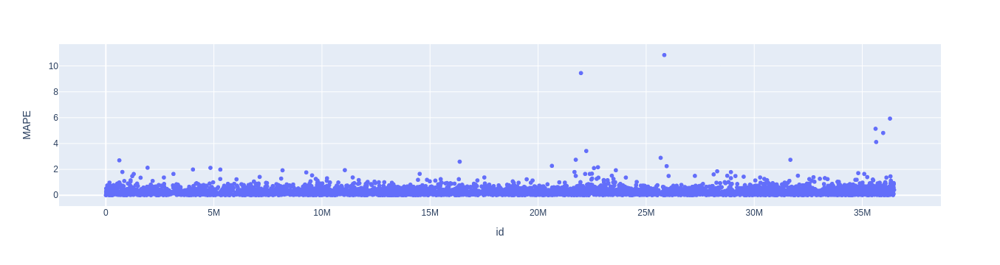

In [238]:
# dropando outlier que impossibilita a visualização (mape muito alto)
aux=df92.drop(df92[df92['id'] == 21304320].index, axis=0)

px.scatter(aux,x='id',y='MAPE',height=500)

## **9.2 Total performance**

In [239]:
df92[['price','predictions','worst_scenario','best_scenario']] = (df92[['price','predictions','worst_scenario','best_scenario']]
                                                                    .replace('[\$,]', '', regex=True).astype(float))

df93=(df92[['price','predictions','worst_scenario','best_scenario']].apply(lambda x: np.sum (x),axis=0)
                                                                    .reset_index()
                                                                    .rename(columns={'index':'Scenario',0:'Values'}))
df93['Values']=df93['Values'].map('${:,.2f}'.format)
df93

,Scenario,Values
0,price,"$725,918.00"
1,predictions,"$631,196.90"
2,worst_scenario,"$376,698.28"
3,best_scenario,"$885,695.71"


## **9.3 Machine learning performance**

In [240]:
df9['error']=df9['price']-df9['predictions']

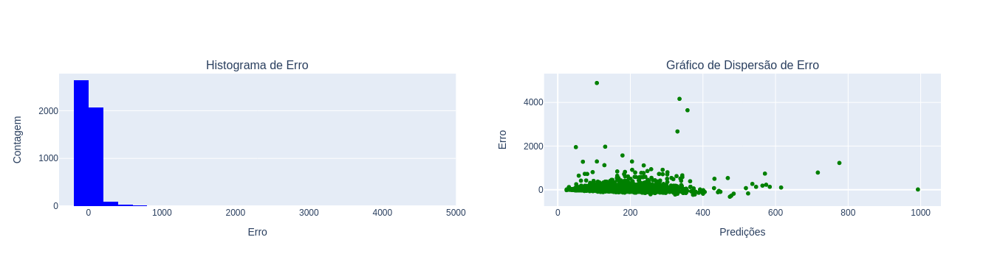

In [243]:
fig = make_subplots(rows=1, cols=2, subplot_titles=('Histograma de Erro', 'Gráfico de Dispersão de Erro'))

# adiciona o histograma
histogram_trace = px.histogram(df9, x='error', nbins=30).update_traces(marker=dict(color='blue')).data[0]
fig.add_trace(histogram_trace, row=1, col=1)
fig.update_xaxes(title_text='Erro', row=1, col=1)
fig.update_yaxes(title_text='Contagem', row=1, col=1)

# adiciona o gráfico de dispersão
scatter_trace = px.scatter(df9,x='predictions',y='error').update_traces(marker=dict(color='green')).data[0]
fig.add_trace(scatter_trace, row=1, col=2)
fig.update_xaxes(title_text='Predições', row=1, col=2)
fig.update_yaxes(title_text='Erro', row=1, col=2)

fig.update_layout(height=600, showlegend=False)

fig.show()

# **10 Entregas**

### a) Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, 
### onde seria mais indicada a compra?

Pensando na compra de um apartamento, seria no bairro_group Bronx, porque, segundo pesquisas, é o local mais acessível de Nova York    
para se comprar um apartamento, e tentando maximizar o lucro, um apartamento cujo preço de aluguel está acima do 2° quartil (maior que 50% dos preços).  

É necessário também escolher um apartamento cujo número de reviews esteja acima da média, o que sinaliza um local facilmente alugado.

Para aumentar a acurácia desse recomendação, seria necessário analisar os valores de compra dos apartamentos.

In [ ]:
# somente no Bronx e número de reviews superior à média geral
aux=df4[(df4['bairro_group']=='Bronx') & (df4['price']>106) & (df4['numero_de_reviews']>23)]

# filtrando apenas apartamentos
keywords = ['Apartment', 'apartment', 'Apt', 'apt']
filter = aux['nome'].str.contains('|'.join(keywords), case=False)
aux = aux[filter]

aux1=aux[['nome','bairro','room_type','price','numero_de_reviews']]
aux1.sort_values('price',ascending=False).head(10).reset_index(drop=True)

### b) O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?

Segundo os resultados já mencionados na EDA, não parece haver uma relação considerável entre o mínimo de noites e a disponibilidade com o preço

### c) Existe algum padrão no texto do nome do local para lugares de mais alto valor?

Sim, existem algumas palavras que se repetem quando se filtra os imóveis com os maiores aluguéis.

Luxury - 5 vezes   
Beautiful - 4 vezes  
SuperBowl - 3 vezes   
Private - 3 vezes   
Townhouse - 3 vezes  
Film - 3 vezes 

**As palavras foram contadas com a ajuda de uma IA com base numa lista dos 50 imóveis com os maiores preços**   
(essas palavras não foram encontradas na lista dos 50 imóveis mais baratos, conforme análise da variável na Bivariate analysis)